In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import gco
import os

files = 'data/Road/src'
np.set_printoptions(suppress=True)


def drawMatches(img1, kp1, des1, img2, kp2, des2):
    matcher = cv.BFMatcher()
    raw_matches = matcher.knnMatch(des1, des2, k=2)
    good_points = []
    good_matches = []
    for m1, m2 in raw_matches:
        if m1.distance < ratio * m2.distance:
            good_points.append((m1.trainIdx, m1.queryIdx))
            good_matches.append([m1])
    imgout = cv.drawMatchesKnn(img1, kp1, img2, kp2, good_matches, None, flags=2)
    return imgout


ratio = 0.85
min_match = 10
sift = cv.SIFT_create()
smoothing_window_size = 800

import random
from numpy import linalg as la


def run_ransac(threshold, image1_kp, image2_kp, is_inlier, sample_size, goal_inliers, max_iterations,
               stop_at_goal=True):
    max_ic = 0
    best_matrix = None

    for i in range(max_iterations):
        index = np.random.choice(np.arange(image1_kp.shape[0]), size=sample_size, replace=False)
        image1_kp_sample = image1_kp[index, :]
        image2_kp_sample = image2_kp[index, :]
        homography_matrix = creat_homography(image1_kp_sample, image2_kp_sample, sample_size)
        ic, ik = 0, 0
        for j in range(len(image1_kp_sample)):
            if is_inlier(compute_homography(image1_kp_sample[j], homography_matrix), image2_kp_sample[j], threshold):
                ik += 1
        if ik == sample_size - 1:
            for j in range(len(image1_kp)):
                if is_inlier(compute_homography(image1_kp[j, :], homography_matrix), image2_kp[j, :], threshold):
                    ic += 1
        if ic > max_ic:
            max_ic = ic
            best_matrix = homography_matrix
            if max_ic > goal_inliers and stop_at_goal:
                print(max_ic, goal_inliers, stop_at_goal)
                break

    return best_matrix


def is_inlier(m, n, threshold):
    if pow(pow(m[0] - n[0], 2) + pow(m[1] - n[1], 2), 0.5) < threshold:
        return True
    else:
        return False


def creat_homography(image1_kp_sample, image2_kp_sample, sample_size=5):
    A_matrix = np.zeros((2 * sample_size, 9))
    x1, y1, x2, y2 = image1_kp_sample[:, 0], image1_kp_sample[:, 1], image2_kp_sample[:, 0], image2_kp_sample[:, 1]
    for i in range(sample_size):
        A_matrix[2 * i:2 * i + 2, :] = [[x1[i], y1[i], 1, 0, 0, 0, -x2[i] * x1[i], -x2[i] * y1[i], -x2[i]],
                                        [0, 0, 0, x1[i], y1[i], 1, -y2[i] * x1[i], -y2[i] * y1[i], -y2[i]]]
    U, sigma, VT = la.svd(np.mat(A_matrix))
    homography_matrix = (VT[-1, :].reshape(3, 3))
    return homography_matrix


def compute_homography(data, homography_matrix):
    x = data[0]
    y = data[1]
    after_x = (homography_matrix[0, 0] * x + homography_matrix[0, 1] * y + homography_matrix[0, 2]) / (
            homography_matrix[2, 0] * x + homography_matrix[2, 1] * y + homography_matrix[2, 2])
    after_y = (homography_matrix[1, 0] * x + homography_matrix[1, 1] * y + homography_matrix[1, 2]) / (
            homography_matrix[2, 0] * x + homography_matrix[2, 1] * y + homography_matrix[2, 2])
    return np.float32([after_x, after_y])


def findgood_points(img1, kp1, des1, img2, kp2, des2):
    matcher = cv.BFMatcher()
    raw_matches = matcher.knnMatch(des1, des2, k=2)
    good_points = []
    good_matches = []
    for m1, m2 in raw_matches:
        if m1.distance < ratio * m2.distance:
            good_points.append((m1.trainIdx, m1.queryIdx))
            good_matches.append([m1])
    return good_points


def stitch_image(fram1, fram2, depthmap, pltshow):
    print(f"compute homogrphy matrix for {fram1} and {fram2}")
    img0102 = cv.imread(files + "/" + f'{fram1}.jpg')
    img3 = cv.imread(files + "/" + f'{fram2}.jpg')
    img0102 = img0102[:, :, [2, 1, 0]]
    img3 = img3[:, :, [2, 1, 0]]

    kp3, des3 = sift.detectAndCompute(img3, None)
    kp0102, des0102 = sift.detectAndCompute(img0102, None)

    good_points = findgood_points(img0102, kp0102, des0102, img3, kp3, des3)

    image0102_kp = np.float32([kp0102[i].pt for (_, i) in good_points])
    image3_kp = np.float32([kp3[i].pt for (i, _) in good_points])
    cols, rows, ch = img0102.shape
    # needtosum = np.float32([rows,cols]*len(image0102_kp)).reshape(-1,2)
    # image0102_kp = image0102_kp +needtosum
    image0102_kp = image0102_kp
    sample_size = 5
    max_iterations = 100000
    goal_inliers = 60
    threshold = 5
    H3_12 = run_ransac(threshold, image3_kp, image0102_kp, is_inlier, sample_size, goal_inliers, max_iterations,
                       stop_at_goal=False)
    return H3_12


def read_directory(directory_name):
    array_of_img = []
    for filename in os.listdir(r"./" + directory_name):
        img = cv.imread(directory_name + "/" + filename)
        array_of_img.append(np.float32(img))
    return array_of_img


array_of_img = read_directory(files)

H, W, D = array_of_img[0].shape
H, W, D

(540, 960, 3)

In [2]:
def homogeneous_coord_grid(h, w):
    X, Y = np.float32(np.meshgrid(
        np.arange(w, dtype=np.float32),
        np.arange(h, dtype=np.float32),
        indexing='xy'))

    X, Y, Z = (np.expand_dims(X, axis=0),
               np.expand_dims(Y, axis=0),
               np.ones([1, h, w], np.float32))

    return np.concatenate([X, Y, Z], axis=0)


def get_coordinates(K, R1, T1, R2, T2, coorsxy, d, h, w):
    coorsxy = np.reshape(coorsxy, [3, -1])
    d = np.reshape(d, [1, -1])

    depth = (T1 - T2).T * d
    remap = (K * R2.T) * ((R1 * K.I) * coorsxy + depth)
    remap = np.divide(remap, remap[2, :])
    remap = np.reshape(np.asarray(remap), [3, h, w])
    return remap


def L2(img_a, img_b):
    return np.sqrt(np.sum(np.square(img_a - img_b), axis=-1, keepdims=True))


def L2_f(img_a, img_b):
    return np.sqrt(np.sum(np.square(img_a - img_b), axis=-1, keepdims=False))


def read_directory(directory_name):
    array_of_img = []
    for filename in os.listdir(r"./" + directory_name):
        img = cv.imread(directory_name + "/" + filename)
        array_of_img.append(np.float32(img))
    return array_of_img


def distance(x_h, projected_x_prime_h):
    return np.sum(np.square(x_h - projected_x_prime_h), axis=0, keepdims=False)


def load_depthmaps(directory, sequence):
    D = []
    for i in range(len(sequence)):
        depthmap_name = os.path.join(directory, "depth_" + str(i).zfill(4) + ".npy")

        depthmap = np.load(depthmap_name)
        D.append(depthmap)
    return D


def load_params(filename):
    with open(filename, 'r') as f:
        frame_num = int(f.readline())
        f.readline()

        def read_vector():
            vec = f.readline().split()
            return np.array([float(x) for x in vec], dtype=np.float32)

        def read_matrix():
            r1 = read_vector()
            r2 = read_vector()
            r3 = read_vector()
            return np.matrix([r1, r2, r3], dtype=np.float32)

        K_sequence = [None] * frame_num
        R_sequence = [None] * frame_num
        T_sequence = [None] * frame_num

        for i in range(frame_num):
            K_sequence[i] = read_matrix()
            R_sequence[i] = read_matrix()
            T_sequence[i] = np.asmatrix(read_vector())
            f.readline()
            f.readline()
    return K_sequence, R_sequence, T_sequence


def remap(I_t_prime, x_prime):
    return cv.remap(
        src=I_t_prime,
        map1=x_prime,
        map2=None,
        interpolation=cv.INTER_NEAREST,
        borderValue=[128, 128, 128])


def get_smooth_simple(d_number, threshold):
    smooth = np.zeros((d_number, d_number))
    for i in range(d_number):
        for j in range(d_number):
            if i != j:
                smooth[i][j] = min(abs(i - j), threshold)
    return smooth


def get_depth_map(unary, smooth, lambda_factor=0.06):
    labels = gco.cut_grid_graph_simple(unary, smooth * lambda_factor, connect=4, n_iter=-1)
    labels = labels.reshape(H, W)
    return labels


def get_depth_map_HW(unary, smooth, lambda_factor=0.06):
    labels = gco.cut_grid_graph_simple(unary, smooth * lambda_factor, connect=4, n_iter=-1)
    return labels

In [3]:
def get_depth_forframe(choose_frame):
    files = 'data/Road/src'
    txt_path = 'data/Road/cameras.txt'
    out_dir = 'data/Road/depth'
    K, R, T = load_params(txt_path)
    array_of_img = read_directory(files)

    H, W, D = array_of_img[0].shape
    disparity = np.arange(0, 0.02, 0.02 / 65)
    d_numbers = len(disparity)

    sequence = np.arange(choose_frame + 1, choose_frame + 8)

    num_frame = sequence.shape[0]
    L = np.zeros((H, W, d_numbers))

    print(f'Disparity Initialization choose_fram =={choose_frame} sequence ={sequence}')
    use_bundle = False
    depth_map_save = []
    img1 = array_of_img[choose_frame]

    h, w = H, W
    I_t = img1
    sigma_c = 1.0
    sigma_d = 2.5

    x_h = homogeneous_coord_grid(H, W)  #[3, h, w]
    d = np.zeros([H, W], dtype=np.float32)  #[h, w]
    L = np.zeros([d_numbers, H, W], dtype=np.float32)  #[d_numbers, h, w]
    D = np.zeros([num_frame, H, W])
    for i in range(num_frame):
        I_t_prime = array_of_img[sequence[i]]
        fram = sequence[i]
        for d_number in range(d_numbers):

            d[:, :] = disparity[d_number]

            x_prime_h = get_coordinates(K[choose_frame], R[choose_frame], T[choose_frame], R[fram], T[fram], x_h, d, h,
                                        w)

            x_prime = np.transpose(x_prime_h[:2, :, :], [1, 2, 0])
            I_t_projected = remap(I_t_prime, x_prime)

            color_distance = L2_f(I_t, I_t_projected)
            pc = sigma_c / (sigma_c + color_distance)
            if not use_bundle:
                L[d_number, :, :] += pc

        u = np.reciprocal(L.max(axis=0, keepdims=True))
        unary = 1 - u * L
        final_unary = np.zeros((H, W, d_number))
        for k in range(d_number):
            final_unary[:, :, k] = unary[k, :, :]

        smooth = get_smooth_simple(d_number, threshold=10)

        depthmap = get_depth_map_HW(final_unary, smooth, lambda_factor=0.1)

        depthmap = depthmap.reshape(H, W)

        D[i, :, :] = depthmap

    print(f'Boundle Optimization: choose_fram =={choose_frame} sequence ={sequence}')
    for i in range(num_frame):
        I_t_prime = array_of_img[sequence[i]]
        fram = sequence[i]
        for d_number in range(d_numbers):
            d[:, :] = disparity[d_number]

            x_prime_h = get_coordinates(K[choose_frame], R[choose_frame], T[choose_frame], R[fram], T[fram], x_h, d, h,
                                        w)

            x_prime = np.transpose(x_prime_h[:2, :, :], [1, 2, 0])
            I_t_projected = remap(I_t_prime, x_prime)
            color_difference = L2_f(I_t, I_t_projected)
            pc = sigma_c / (sigma_c + color_difference)

            depth_indices = np.array(D[i, :, :]).astype(np.int64)

            depth_indices_projected = cv.remap(
                src=depth_indices,
                map1=x_prime,
                map2=None,
                interpolation=cv.INTER_NEAREST,
                borderValue=int(d_number / 2.0))
            np.take(disparity, depth_indices_projected, out=d)

            projected_x_prime_h = get_coordinates(K[fram], R[fram], T[fram], R[choose_frame], T[choose_frame],
                                                  x_prime_h, d, h, w)
            color_distance = distance(x_h, projected_x_prime_h)

            pv = np.exp(color_distance / (-2 * sigma_d * sigma_d))

            L[d_number, :, :] += pc * pv

    u = np.reciprocal(L.max(axis=0, keepdims=True))
    unary = 1 - u * L
    final_unary = np.zeros((H, W, d_number))
    for i in range(d_number):
        final_unary[:, :, i] = unary[i, :, :]

    smooth = get_smooth_simple(d_number, threshold=10)

    print('get_depth_map................................')
    depthmap = get_depth_map_HW(final_unary, smooth, lambda_factor=0.1)

    depthmap = depthmap.reshape(H, W)
    plt.figure(dpi=300, figsize=(24, 8))
    plt.subplot(121)
    plt.imshow(depthmap, cmap='gray')
    plt.title('Best Result for Depth from Video by using boundle optimization')
    plt.axis("off")
    plt.subplot(122)
    plt.title('Origin image')
    img = cv.imread(files + "/" + f'test0{choose_frame}.jpg')
    img = img[:, :, [2, 1, 0]]
    plt.imshow(img)
    plt.show()
    return depthmap

Disparity Initialization choose_fram ==100 sequence =[101 102 103 104 105 106 107]
Boundle Optimization: choose_fram ==100 sequence =[101 102 103 104 105 106 107]
get_depth_map................................


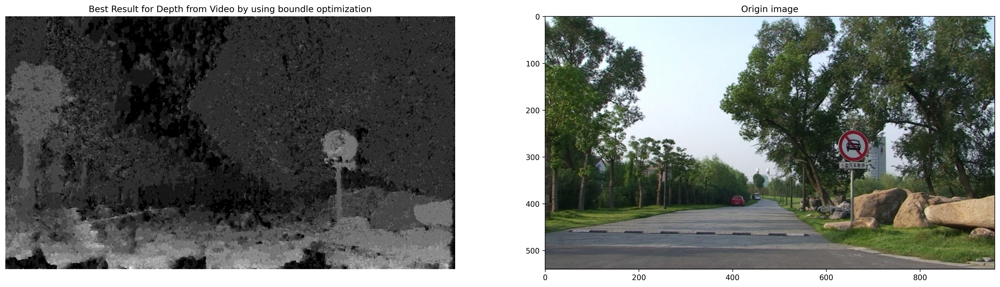

 Finish get depth for frame 100
Disparity Initialization choose_fram ==105 sequence =[106 107 108 109 110 111 112]
Boundle Optimization: choose_fram ==105 sequence =[106 107 108 109 110 111 112]
get_depth_map................................


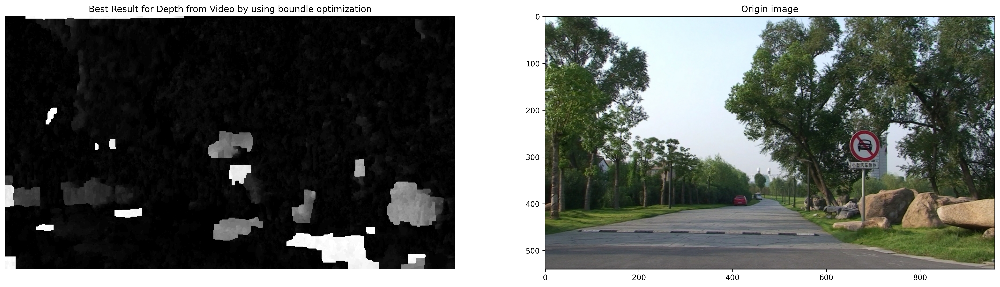

 Finish get depth for frame 105
Disparity Initialization choose_fram ==110 sequence =[111 112 113 114 115 116 117]
Boundle Optimization: choose_fram ==110 sequence =[111 112 113 114 115 116 117]
get_depth_map................................


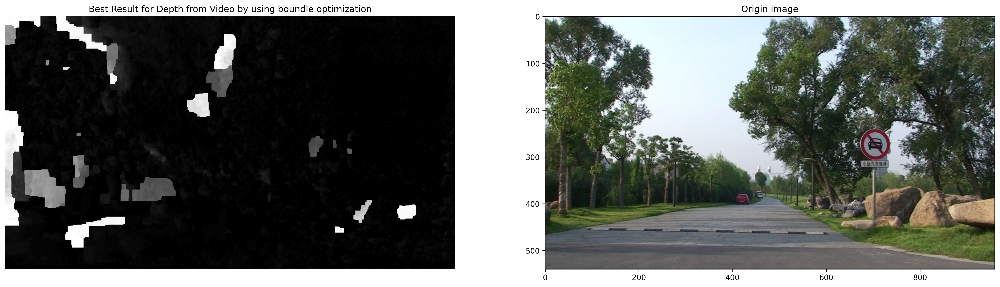

 Finish get depth for frame 110
Disparity Initialization choose_fram ==115 sequence =[116 117 118 119 120 121 122]
Boundle Optimization: choose_fram ==115 sequence =[116 117 118 119 120 121 122]


KeyboardInterrupt: 

In [4]:
choose_frame_sequence = np.array([100, 105, 110, 115, 120, 125])
# choose_frame_sequence = np.array([100,105,110])
depthmap_seq = []
for i in range(len(choose_frame_sequence)):
    depthmap_seq.append(get_depth_forframe(choose_frame_sequence[i]))
    print(f' Finish get depth for frame {choose_frame_sequence[i]}')

In [ ]:
depthmap_homo_seq = []
H_seq = []
for i in range(len(choose_frame_sequence) - 1):
    H_seq.append(
        stitch_image(f'test0{choose_frame_sequence[0]}', f'test0{choose_frame_sequence[i + 1]}', depthmap_seq[i + 1],
                     pltshow=False))

In [ ]:
cols, rows = depthmap_seq[0].shape
dst_seq = []
xx_seq = []
print(depthmap_seq[0].dtype)
xx = np.where(depthmap_seq[0] > 2, 1, 0)
plt.figure(dpi=300, figsize=(24, 8))
plt.subplot(131)
plt.imshow(np.array(depthmap_seq[0]), cmap='gray')
plt.title(f'origin depth map for frame {choose_frame_sequence[0]}')
plt.subplot(132)
plt.imshow(np.array(depthmap_seq[0]), cmap='gray')
plt.title(f'origin depth map for frame {choose_frame_sequence[0]}')
plt.subplot(133)
plt.title(f'show the background for depth map of frame {choose_frame_sequence[0]}')
plt.imshow(xx)
plt.show()
for i in range(len(choose_frame_sequence) - 1):
    # Max = np.float32(depthmap_seq[i+1].max())
    # cv.imwrite(f'{i}.png', np.uint8(depthmap_seq[i+1]/Max*255))
    cv.imwrite(f'{i}.png', depthmap_seq[i + 1])
    depth = cv.imread(f'{i}.png', cv.IMREAD_GRAYSCALE)
    dst3 = cv.warpPerspective(depth, H_seq[i], (rows, cols))
    dst3 = np.array(dst3)
    xx = xx.astype(np.int32)
    xx = np.where(dst3 > 2, 1, 0)

    plt.figure(dpi=300, figsize=(24, 8))
    plt.subplot(131)
    plt.title(f'origin depth map for frame {choose_frame_sequence[i + 1]}')
    plt.imshow(np.array(depth), cmap='gray')
    plt.subplot(132)
    plt.title(f'homography transform for depth map of frame {choose_frame_sequence[i + 1]} ')
    plt.imshow(dst3, cmap='gray')
    plt.subplot(133)
    plt.title(f'show the background for depth map of frame {choose_frame_sequence[i + 1]}')
    plt.imshow(xx)
    plt.show()
    xx_seq.append(xx)



In [ ]:
xxfinal = np.zeros((cols, rows))
depth_final = np.array(depthmap_seq[0])  # depth0
for i in range(cols):
    for j in range(rows):
        vote = 0
        for d in range(len(xx_seq)):
            vote = vote + xx_seq[d][i, j]
        if vote >= len(xx_seq) / 2:
            xxfinal[i, j] = 1
        if xxfinal[i, j] != 1:
            depth_final[i, j] = 0

In [ ]:
img = cv.imread(files + "/" + f'test0100.jpg')
img = img[:, :, [2, 1, 0]]
xx = np.where(depthmap_seq[5] > 2, 1, 0)
plt.figure(dpi=300, figsize=(24, 8))
plt.subplot(231)
plt.imshow(img[:, 0:900])
plt.title(f'origin image for frame test0100.jpg')
plt.axis("off")
plt.subplot(232)
plt.imshow(np.array(depthmap_seq[5][:, 0:900]), cmap='gray')
plt.axis("off")
plt.title(f'origin depth map for frame {choose_frame_sequence[0]}')
plt.subplot(233)
plt.title(f'show the background for depth map of frame {choose_frame_sequence[0]}')
plt.imshow(xx[:, 0:900])
plt.axis("off")
plt.subplot(234)
plt.title(f'show the background for depth map of frame {choose_frame_sequence[0]} after processing')
plt.imshow(xxfinal[:, 0:900])
plt.axis("off")
plt.subplot(235)
plt.title(f'show the final result of {choose_frame_sequence[0]}')
plt.imshow(depth_final[:, 0:900], cmap='gray')
plt.axis("off")
plt.show()